In [66]:
import matplotlib.pyplot as plt
import numpy as np

from skimage import exposure
from skimage import io
from skimage import util
from scipy.spatial.distance import euclidean

from skimage.metrics import mean_squared_error, peak_signal_noise_ratio, structural_similarity

## PREVIOUS ISSUES AND NOISE ADDITION

### Load noisy images

(2021, 2021)


(<AxesSubplot:>,
 (-0.5, 2020.5, 2020.5, -0.5))

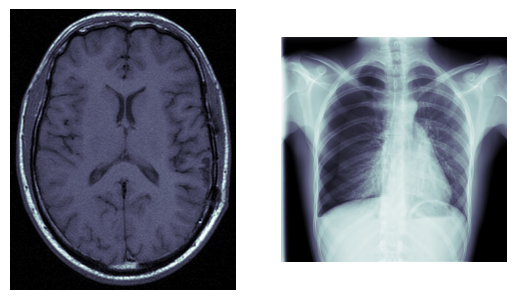

In [67]:
brain = io.imread('Brain.tif',as_gray=True)
chest = io.imread('Chest_RX.tif', as_gray=True)
print(chest.shape)
plt.figure()
plt.subplot(1, 2, 1), plt.imshow(brain, cmap="bone"), plt.axis('off')
plt.subplot(1, 2, 2), plt.imshow(chest, cmap="bone"), plt.axis('off')


### Resize chest image
The chest image is too big and needs to be resized in order to reduce filtering computing time.

In [68]:
from skimage.transform import resize
print("Chest old shape", chest.shape)
chest = resize(chest, (chest.shape[0] // 4, chest.shape[1] // 4),
                       anti_aliasing=True)
print("Chest new shape", chest.shape)


Chest old shape (2021, 2021)
Chest new shape (505, 505)


### Add  Gaussian noise

(<AxesSubplot:>,
 (-0.5, 343.5, 427.5, -0.5))

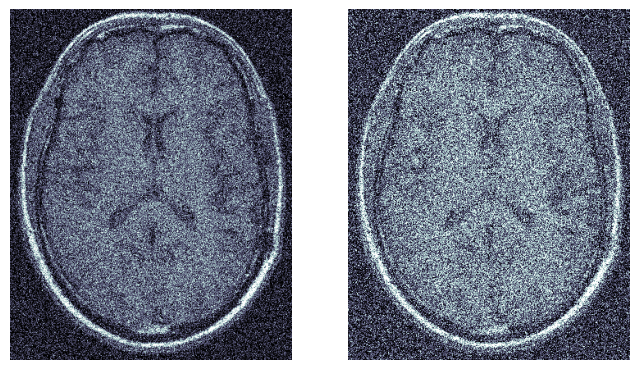

In [69]:
noisy_brain1 = util.random_noise(brain, mode='gaussian', mean=0.1, var=0.05)
noisy_brain2 = util.random_noise(brain, mode='gaussian', mean=0.2, var=0.1)

plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1), plt.imshow(noisy_brain1, cmap='bone'), plt.axis('off')
plt.subplot(1, 2, 2), plt.imshow(noisy_brain2, cmap='bone'), plt.axis('off')

(<AxesSubplot:>,
 (-0.5, 504.5, 504.5, -0.5))

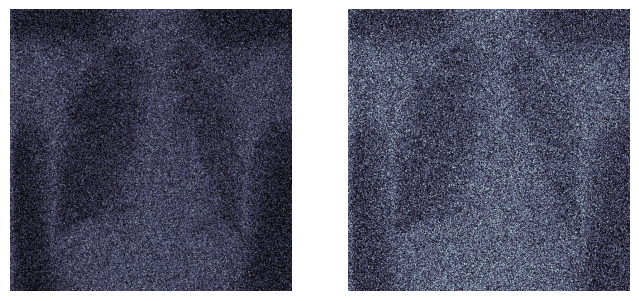

In [70]:
noisy_chest1 = util.random_noise(chest, mode='gaussian', mean=0.1, var=0.05)
noisy_chest2 = util.random_noise(chest, mode='gaussian', mean=0.2, var=0.1)

plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1), plt.imshow(noisy_chest1, cmap='bone'), plt.axis('off')
plt.subplot(1, 2, 2), plt.imshow(noisy_chest2, cmap='bone'), plt.axis('off')

### Add salt and pepper (impulsive) noise

(<AxesSubplot:>,
 (-0.5, 343.5, 427.5, -0.5))

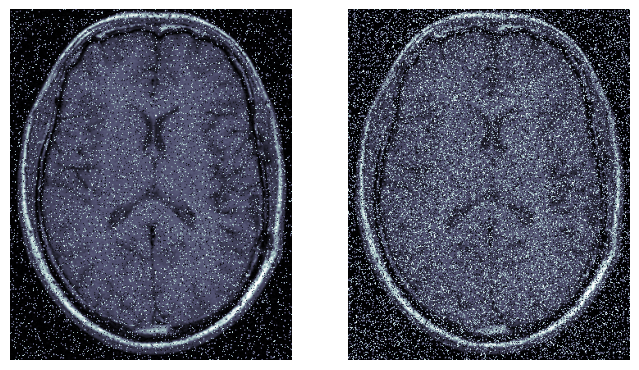

In [71]:
sigma_sp1 = 0.1
sigma_sp2 = 0.25

noisy_brain3 = util.random_noise(brain, mode='s&p', amount=sigma_sp1)
noisy_brain4 = util.random_noise(brain, mode='s&p', amount=sigma_sp2)

plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1), plt.imshow(noisy_brain3, cmap='bone'), plt.axis('off')
plt.subplot(1, 2, 2), plt.imshow(noisy_brain4, cmap='bone'), plt.axis('off')

(<AxesSubplot:>,
 (-0.5, 504.5, 504.5, -0.5))

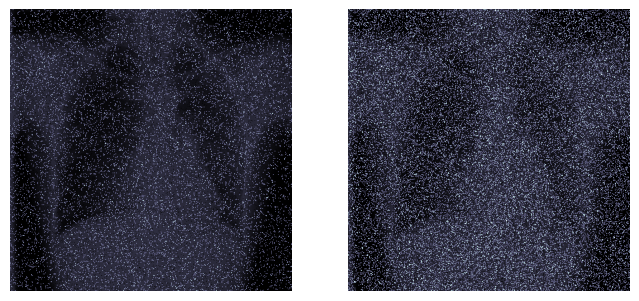

In [72]:
noisy_chest3 = util.random_noise(chest, mode='s&p', amount=sigma_sp1)
noisy_chest4 = util.random_noise(chest, mode='s&p', amount=sigma_sp2)

plt.figure(figsize=(8, 6))
plt.subplot(1, 2, 1), plt.imshow(noisy_chest3, cmap='bone'), plt.axis('off')
plt.subplot(1, 2, 2), plt.imshow(noisy_chest4, cmap='bone'), plt.axis('off')

# Normalize all the images


In [73]:
brain = brain / np.max(brain)
chest = chest / np.max(chest)
noisy_brain1 = noisy_brain1 / np.max(noisy_brain1)
noisy_brain2 = noisy_brain2 / np.max(noisy_brain2)
noisy_chest1 = noisy_chest1 / np.max(noisy_chest1)
noisy_chest2 = noisy_chest2 / np.max(noisy_chest2)
noisy_brain3 = noisy_brain3 / np.max(noisy_brain3)
noisy_brain4 = noisy_brain4 / np.max(noisy_brain4)
noisy_chest3 = noisy_chest3 / np.max(noisy_chest3)
noisy_chest4 = noisy_chest4 / np.max(noisy_chest4)

# Bilateral filtering
Image denoising is done by filtering which can be
broadly divided into categories: linear filtering and nonlinear filtering. Mean filtering and Gaussian filtering are
the example of spatial denoising methods. They are
linear methods which cause blurring the images and
simultaneously suppress the details. The performances
of linear filters are not satisfactory because they blur the
sharp edges; destroy lines and other finer details. To
avoid these problems non-linear filtering is used.
Bilateral filtering [15] is one of the examples of nonlinear filtering. It is a non-iterative method. It combines
domain and range filters simultaneously. It preserves
edge information while denoising. However it does not
give satisfactory results, real gray levels are polluted
seriously and the range filter cannot work properly. This
phenomenon is called propagation of noise (PoN) [13]

[13] Zhiwu Liao,Shaoxiang Hu,Zhiqiang Yu,Dan Sun.
Medical Image Blind Denoising Using Context
Bilteteral Filter.

[15] Lu Zhang, Jiaming Chen, Yuemin Zhu, Jianhua
Luo. Comparisons of Several New Denoising
Methods for Medical Images.

## Same sigmaSpace and sigmaColor (0.2), changing d (Diameter of each pixel neighborhood)

In [74]:
import cv2

def denoise_bilateral(original_image, noisy_image, d, sigma_s, sigma_r):
    
    bilateral1 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_image), 1, sigma_s, sigma_r)
    bilateral2 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_image), 10,sigma_s, sigma_r)
    bilateral3 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_image), 50,sigma_s, sigma_r)

    plt.figure(figsize=(8, 6))
    plt.subplot(2, 2, 1), plt.imshow(noisy_image, cmap='bone'), plt.axis('off')
    plt.subplot(2, 2, 2), plt.imshow(bilateral1, cmap='bone'), plt.axis('off')
    plt.subplot(2, 2, 3), plt.imshow(bilateral2, cmap='bone'), plt.axis('off')  
    plt.subplot(2, 2, 4), plt.imshow(bilateral3, cmap='bone'), plt.axis('off')

    bilateral1 = bilateral1 / np.max(bilateral1)
    bilateral2 = bilateral2 / np.max(bilateral2)
    bilateral3 = bilateral3 / np.max(bilateral3)
    
    print("Original-Noisy images PSNR", peak_signal_noise_ratio(original_image, noisy_image, data_range=1), "dB.")
    print("Original-Denoisy images PSNR", peak_signal_noise_ratio(original_image, bilateral1, data_range=1), "dB.")
    print("Original-Denoisy images PSNR", peak_signal_noise_ratio(original_image, bilateral2, data_range=1), "dB.")
    print("Original-Denoisy images PSNR", peak_signal_noise_ratio(original_image, bilateral3, data_range=1), "dB.")

    print("Original-Noisy MSE", mean_squared_error(original_image, noisy_image))
    print("Original-Denoised1 MSE", mean_squared_error(original_image, bilateral1))
    print("Original-Denoised2 MSE", mean_squared_error(original_image, bilateral2))
    print("Original-Denoised3 MSE", mean_squared_error(original_image, bilateral3))
    
    print("Original-Noisy images SSIM", structural_similarity(original_image, noisy_image, data_range=1))
    print("Original-Denoisy images SSIM", structural_similarity(original_image, bilateral1, data_range=1))
    print("Original-Denoisy images SSIM", structural_similarity(original_image, bilateral2, data_range=1))
    print("Original-Denoisy images SSIM", structural_similarity(original_image, bilateral3, data_range=1))



### Low noise brain image denoising

Original-Noisy images PSNR 12.692480070524706 dB.
Original-Denoisy images PSNR 7.839530760841802 dB.
Original-Denoisy images PSNR 7.839530760841802 dB.
Original-Denoisy images PSNR 7.839530760841802 dB.
Original-Noisy MSE 0.05379624873549484
Original-Denoised1 MSE 0.16445494011089143
Original-Denoised2 MSE 0.16445494011089143
Original-Denoised3 MSE 0.16445494011089143
Original-Noisy images SSIM 0.12173955065902055
Original-Denoisy images SSIM 0.08022499071609948
Original-Denoisy images SSIM 0.08022499071609948
Original-Denoisy images SSIM 0.08022499071609948


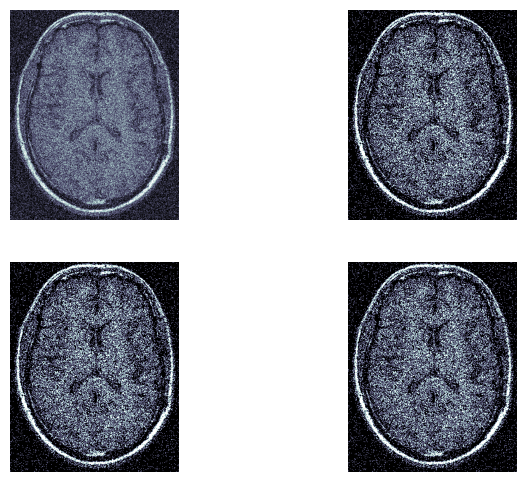

In [75]:
denoise_bilateral(brain, noisy_brain1, 1, 0.2, 0.2)

### High noise brain image denoising

Original-Noisy images PSNR 9.271913491911555 dB.
Original-Denoisy images PSNR 6.067221505840614 dB.
Original-Denoisy images PSNR 6.067221505840614 dB.
Original-Denoisy images PSNR 6.067221505840614 dB.
Original-Noisy MSE 0.11825204250371342
Original-Denoised1 MSE 0.2473305990682366
Original-Denoised2 MSE 0.2473305990682366
Original-Denoised3 MSE 0.2473305990682366
Original-Noisy images SSIM 0.07446870441674419
Original-Denoisy images SSIM 0.04406640374403183
Original-Denoisy images SSIM 0.04406640374403183
Original-Denoisy images SSIM 0.04406640374403183


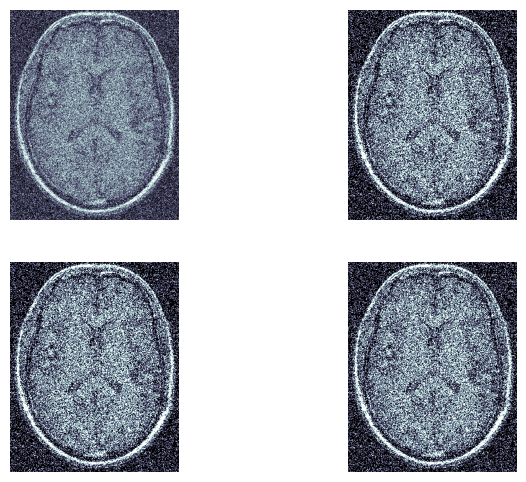

In [76]:
denoise_bilateral(brain, noisy_brain2, 1, 0.2, 0.2)

### Low noise chest image denoising

Original-Noisy images PSNR 7.50940604032478 dB.
Original-Denoisy images PSNR 4.847310569910264 dB.
Original-Denoisy images PSNR 4.847310569910264 dB.
Original-Denoisy images PSNR 4.847310569910264 dB.
Original-Noisy MSE 0.17744321432116866
Original-Denoised1 MSE 0.3275434680189648
Original-Denoised2 MSE 0.3275434680189648
Original-Denoised3 MSE 0.3275434680189648
Original-Noisy images SSIM 0.024283852681301434
Original-Denoisy images SSIM 0.01656427266843291
Original-Denoisy images SSIM 0.01656427266843291
Original-Denoisy images SSIM 0.01656427266843291


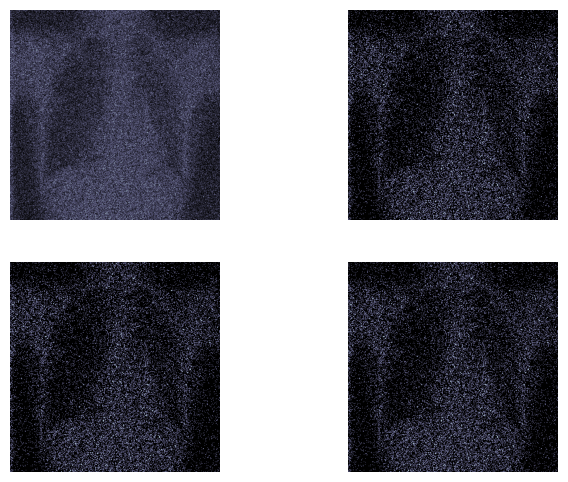

In [77]:
denoise_bilateral(chest, noisy_chest1, 1, 0.2, 0.2)

### High noise chest image denoising

Original-Noisy images PSNR 7.826424062561001 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Noisy MSE 0.16495200308533434
Original-Denoised1 MSE 0.30886964964547414
Original-Denoised2 MSE 0.30886964964547414
Original-Denoised3 MSE 0.30886964964547414
Original-Noisy images SSIM 0.014754776736102967
Original-Denoisy images SSIM 0.005793604469159398
Original-Denoisy images SSIM 0.005793604469159398
Original-Denoisy images SSIM 0.005793604469159398


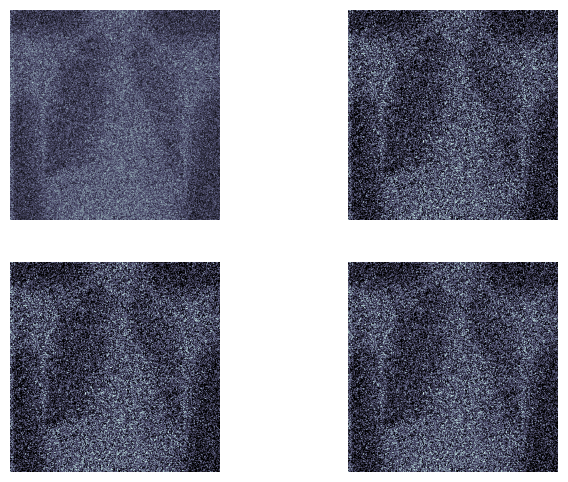

In [78]:
denoise_bilateral(chest, noisy_chest2, 1, 0.2, 0.2)

Too low sigma values makes that increasing distance has no effect.

## Higher sigma values (0.3)
### Low noise brain image denoising

Original-Noisy images PSNR 12.692480070524706 dB.
Original-Denoisy images PSNR 7.839530760841802 dB.
Original-Denoisy images PSNR 7.839530760841802 dB.
Original-Denoisy images PSNR 7.839530760841802 dB.
Original-Noisy MSE 0.05379624873549484
Original-Denoised1 MSE 0.16445494011089143
Original-Denoised2 MSE 0.16445494011089143
Original-Denoised3 MSE 0.16445494011089143
Original-Noisy images SSIM 0.12173955065902055
Original-Denoisy images SSIM 0.08022499071609948
Original-Denoisy images SSIM 0.08022499071609948
Original-Denoisy images SSIM 0.08022499071609948


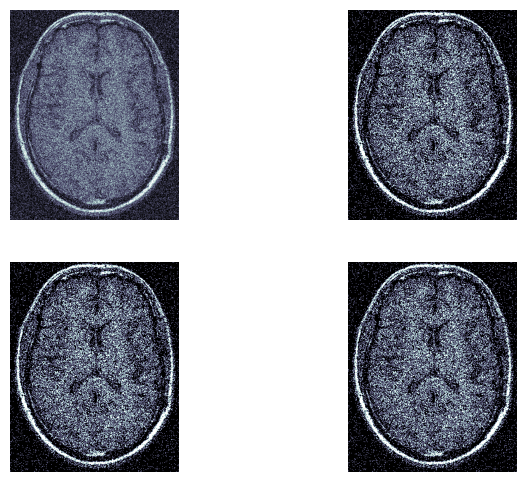

In [143]:
# brain 1
denoise_bilateral(brain, noisy_brain1, 1, 0.3, 0.3)

### High noise brain image denoising

Original-Noisy images PSNR 9.271913491911555 dB.
Original-Denoisy images PSNR 10.573712344689149 dB.
Original-Denoisy images PSNR 6.067221505840614 dB.
Original-Denoisy images PSNR 6.067221505840614 dB.
Original-Noisy MSE 0.11825204250371342
Original-Denoised1 MSE 0.0876251482071706
Original-Denoised2 MSE 0.2473305990682366
Original-Denoised3 MSE 0.2473305990682366
Original-Noisy images SSIM 0.07446870441674419
Original-Denoisy images SSIM 0.11638076746510034
Original-Denoisy images SSIM 0.04406640374403183
Original-Denoisy images SSIM 0.04406640374403183


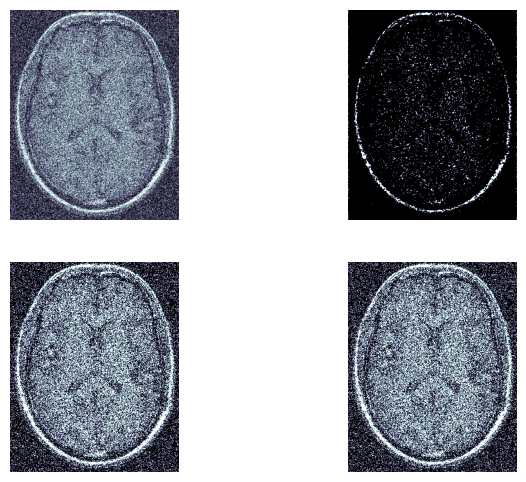

In [157]:
# brain 2
denoise_bilateral(brain, noisy_brain2, 1, 0.3, 0.3)

### Low noise chest image denoising

Original-Noisy images PSNR 7.50940604032478 dB.
Original-Denoisy images PSNR 4.398692642546927 dB.
Original-Denoisy images PSNR 4.847310569910264 dB.
Original-Denoisy images PSNR 4.847310569910264 dB.
Original-Noisy MSE 0.17744321432116866
Original-Denoised1 MSE 0.36318736867421975
Original-Denoised2 MSE 0.3275434680189648
Original-Denoised3 MSE 0.3275434680189648
Original-Noisy images SSIM 0.024283852681301434
Original-Denoisy images SSIM 0.0582355187087015
Original-Denoisy images SSIM 0.01656427266843291
Original-Denoisy images SSIM 0.01656427266843291


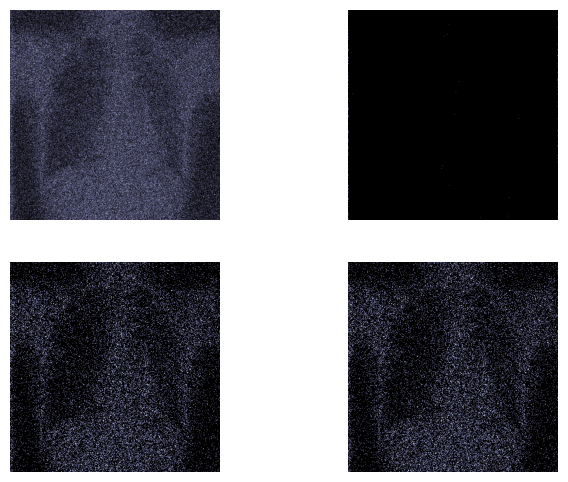

In [81]:
# chest 1
denoise_bilateral(chest, noisy_chest1, 1, 0.3, 0.3)

### High noise chest image denoising

Original-Noisy images PSNR 7.826424062561001 dB.
Original-Denoisy images PSNR 4.418085276691266 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Noisy MSE 0.16495200308533434
Original-Denoised1 MSE 0.3615692366321878
Original-Denoised2 MSE 0.30886964964547414
Original-Denoised3 MSE 0.30886964964547414
Original-Noisy images SSIM 0.014754776736102967
Original-Denoisy images SSIM 0.05773277708923273
Original-Denoisy images SSIM 0.005793604469159398
Original-Denoisy images SSIM 0.005793604469159398


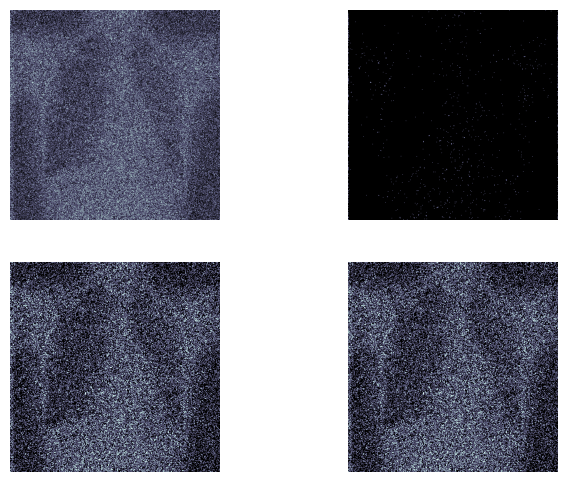

In [82]:
denoise_bilateral(chest, noisy_chest2, 1, 0.3, 0.3)

Higher sigma values have little effect. They really sharpen the edge but delete all the information otherwhere.

## Different sigmaColor value, constant d and sigmaSpace

In [88]:
bilateral1 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_brain2), 1, 2, 1)
bilateral2 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_brain2), 1, 4, 1)
bilateral3 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_brain2), 1, 7, 1)

(<AxesSubplot:>,
 (-0.5, 343.5, 427.5, -0.5))

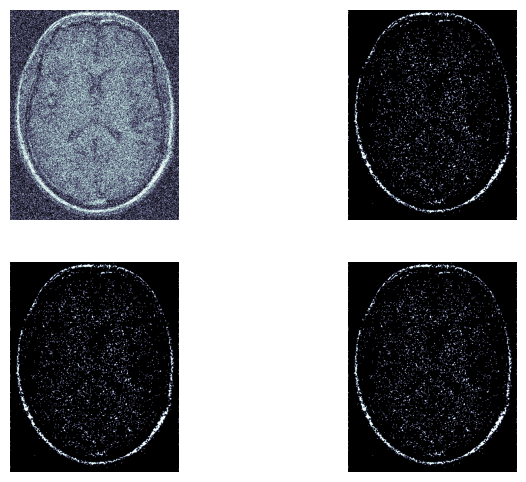

In [89]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 2, 1), plt.imshow(noisy_brain2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 2), plt.imshow(bilateral1, cmap='bone'), plt.axis('off')

plt.subplot(2, 2, 3), plt.imshow(bilateral2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 4), plt.imshow(bilateral3, cmap='bone'), plt.axis('off')

In [90]:
bilateral1 = bilateral1 / np.max(bilateral1)
bilateral2 = bilateral2 / np.max(bilateral2)
bilateral3 = bilateral3 / np.max(bilateral3)

In [91]:
print("Original-Noisy images PSNR", peak_signal_noise_ratio(brain, noisy_brain2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(brain, bilateral1), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(brain, bilateral2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(brain, bilateral3), "dB.")

print("Original-Noisy MSE", mean_squared_error(brain, noisy_brain2))
print("Original-Denoised1 MSE", mean_squared_error(brain, bilateral1))
print("Original-Denoised2 MSE", mean_squared_error(brain, bilateral2))
print("Original-Denoised3 MSE", mean_squared_error(brain, bilateral3))


Original-Noisy images PSNR 9.271913491911555 dB.
Original-Denoisy images PSNR 10.59966804987071 dB.
Original-Denoisy images PSNR 10.604938223410274 dB.
Original-Denoisy images PSNR 10.604938223410274 dB.
Original-Noisy MSE 0.11825204250371342
Original-Denoised1 MSE 0.08710301640291662
Original-Denoised2 MSE 0.0869973807994033
Original-Denoised3 MSE 0.0869973807994033


Modifying sigmaColor with constant distance and sigmaSpace values has the same effect for all. It still produce sharpen edges but by loosing a lot of information.

## Increasing the constant sigmaSpace value, constant d, variable sigmaColor

In [92]:
bilateral1 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_brain2), 1, 2, 25)
bilateral2 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_brain2), 1, 4, 25)
bilateral3 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_brain2), 1, 7, 25)

(<AxesSubplot:>,
 (-0.5, 343.5, 427.5, -0.5))

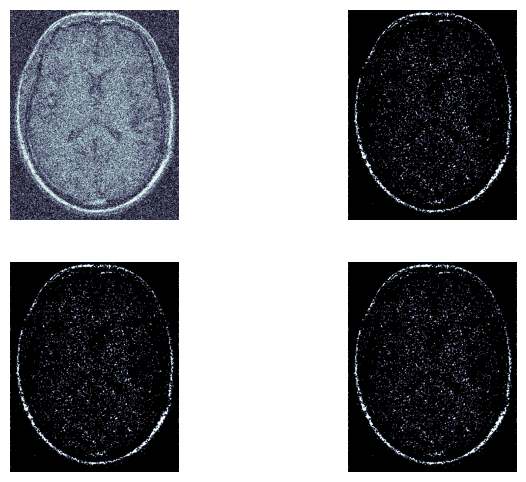

In [93]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 2, 1), plt.imshow(noisy_brain2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 2), plt.imshow(bilateral1, cmap='bone'), plt.axis('off')

plt.subplot(2, 2, 3), plt.imshow(bilateral2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 4), plt.imshow(bilateral3, cmap='bone'), plt.axis('off')

In [94]:
bilateral1 = bilateral1 / np.max(bilateral1)
bilateral2 = bilateral2 / np.max(bilateral2)
bilateral3 = bilateral3 / np.max(bilateral3)


In [95]:
print("Original-Noisy images PSNR", peak_signal_noise_ratio(brain, noisy_brain2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(brain, bilateral1), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(brain, bilateral2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(brain, bilateral3), "dB.")

print("Original-Noisy MSE", mean_squared_error(brain, noisy_brain2))
print("Original-Denoised1 MSE", mean_squared_error(brain, bilateral1))
print("Original-Denoised2 MSE", mean_squared_error(brain, bilateral2))
print("Original-Denoised3 MSE", mean_squared_error(brain, bilateral3))


Original-Noisy images PSNR 9.271913491911555 dB.
Original-Denoisy images PSNR 10.604938223410274 dB.
Original-Denoisy images PSNR 10.604938223410274 dB.
Original-Denoisy images PSNR 10.604938223410274 dB.
Original-Noisy MSE 0.11825204250371342
Original-Denoised1 MSE 0.0869973807994033
Original-Denoised2 MSE 0.0869973807994033
Original-Denoised3 MSE 0.0869973807994033


Higher sigmaSpace value has no effect.

## Tuning parameters according to the litterature
Zhiwu Liao, Shaoxiang Hu, Zhiqiang Yu and Dan Sun, "Medical image blind denoising using context bilateral filter," 2010 International Conference of Medical Image Analysis and Clinical Application, Guangzhou, China, 2010, pp. 12-17, doi: 10.1109/MIACA.2010.5528280.


In [151]:
sigma_r = 1.95*0.2 
sigma_s = 80*sigma_r

In [152]:
bilateral1 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_brain2), 1, sigma_r, sigma_s)
bilateral2 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_brain2), 3, sigma_r, sigma_s)
bilateral3 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_brain2), 5, sigma_r, sigma_s)

(<AxesSubplot:>,
 (-0.5, 343.5, 427.5, -0.5))

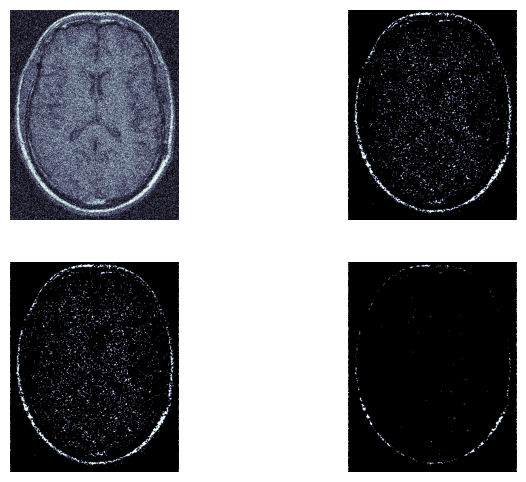

In [153]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 2, 1), plt.imshow(noisy_brain1, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 2), plt.imshow(bilateral1, cmap='bone'), plt.axis('off')

plt.subplot(2, 2, 3), plt.imshow(bilateral2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 4), plt.imshow(bilateral3, cmap='bone'), plt.axis('off')

In [154]:
bilateral1 = bilateral1 / np.max(bilateral1)
bilateral2 = bilateral2 / np.max(bilateral2)
bilateral3 = bilateral3 / np.max(bilateral3)

print("Original-Noisy images PSNR", peak_signal_noise_ratio(brain, noisy_brain2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(brain, bilateral1), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(brain, bilateral2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(brain, bilateral3), "dB.")

print("Original-Noisy MSE", mean_squared_error(brain, noisy_brain2))
print("Original-Denoised1 MSE", mean_squared_error(brain, bilateral1))
print("Original-Denoised2 MSE", mean_squared_error(brain, bilateral2))
print("Original-Denoised3 MSE", mean_squared_error(brain, bilateral3))

Original-Noisy images PSNR 9.271913491911555 dB.
Original-Denoisy images PSNR 10.573712344689149 dB.
Original-Denoisy images PSNR 10.573712344689149 dB.
Original-Denoisy images PSNR 10.642647986097815 dB.
Original-Noisy MSE 0.11825204250371342
Original-Denoised1 MSE 0.0876251482071706
Original-Denoised2 MSE 0.0876251482071706
Original-Denoised3 MSE 0.08624525317156449


Choosing sigma values according to the litterature does not produce better PSNR.

## Low sigmaColor and sigmaSpace values on high noise chest image
This image has almost no edges and is thus no filtered or destroyed by the filtering.

In [99]:
bilateral1 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest2), 1, 0.2, 0.2)
bilateral2 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest2), 3, 0.2, 0.2)
bilateral3 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest2), 5, 0.2, 0.2)

(<AxesSubplot:>,
 (-0.5, 504.5, 504.5, -0.5))

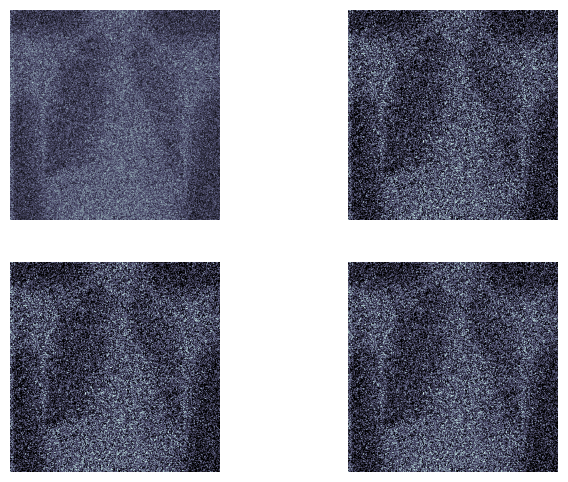

In [100]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 2, 1), plt.imshow(noisy_chest2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 2), plt.imshow(bilateral1, cmap='bone'), plt.axis('off')

plt.subplot(2, 2, 3), plt.imshow(bilateral2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 4), plt.imshow(bilateral3, cmap='bone'), plt.axis('off')

In [101]:
bilateral1 = bilateral1 / np.max(bilateral1)
bilateral2 = bilateral2 / np.max(bilateral2)
bilateral3 = bilateral3 / np.max(bilateral3)


In [102]:
print("Original-Noisy images PSNR", peak_signal_noise_ratio(chest, noisy_chest2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral1), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral3), "dB.")

print("Original-Noisy MSE", mean_squared_error(chest, noisy_chest2))
print("Original-Denoised1 MSE", mean_squared_error(chest, bilateral1))
print("Original-Denoised2 MSE", mean_squared_error(chest, bilateral2))
print("Original-Denoised3 MSE", mean_squared_error(chest, bilateral3))


Original-Noisy images PSNR 7.826424062561001 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Noisy MSE 0.16495200308533434
Original-Denoised1 MSE 0.30886964964547414
Original-Denoised2 MSE 0.30886964964547414
Original-Denoised3 MSE 0.30886964964547414


Same as for the brain image, constant and low sigma values makes that distance has no effect. It sharpens the images but also adds noise.

## Increased sigmacolor and sigmaspace on high noise chest image

In [103]:
bilateral1 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest2), 1, 0.3, 0.3)
bilateral2 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest2), 3, 0.3, 0.3)
bilateral3 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest2), 5, 0.3, 0.3)

(<AxesSubplot:>,
 (-0.5, 504.5, 504.5, -0.5))

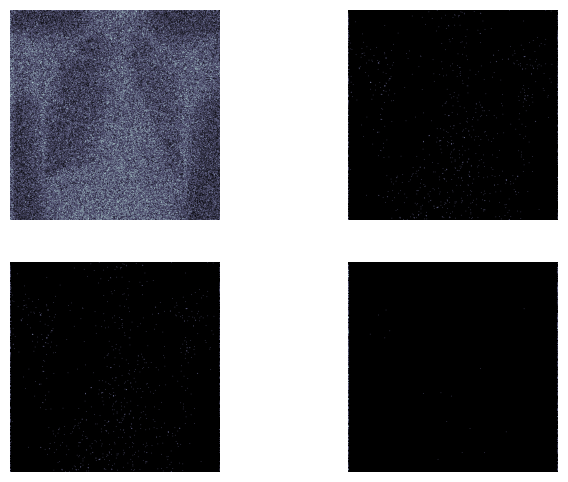

In [104]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 2, 1), plt.imshow(noisy_chest2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 2), plt.imshow(bilateral1, cmap='bone'), plt.axis('off')

plt.subplot(2, 2, 3), plt.imshow(bilateral2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 4), plt.imshow(bilateral3, cmap='bone'), plt.axis('off')

In [105]:
bilateral1 = bilateral1 / np.max(bilateral1)
bilateral2 = bilateral2 / np.max(bilateral2)
bilateral3 = bilateral3 / np.max(bilateral3)


In [106]:
print("Original-Noisy images PSNR", peak_signal_noise_ratio(chest, noisy_chest2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral1), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral3), "dB.")

print("Original-Noisy MSE", mean_squared_error(chest, noisy_chest2))
print("Original-Denoised1 MSE", mean_squared_error(chest, bilateral1))
print("Original-Denoised2 MSE", mean_squared_error(chest, bilateral2))
print("Original-Denoised3 MSE", mean_squared_error(chest, bilateral3))

Original-Noisy images PSNR 7.826424062561001 dB.
Original-Denoisy images PSNR 4.418085276691266 dB.
Original-Denoisy images PSNR 4.418085276691266 dB.
Original-Denoisy images PSNR 4.403865397434962 dB.
Original-Noisy MSE 0.16495200308533434
Original-Denoised1 MSE 0.3615692366321878
Original-Denoised2 MSE 0.3615692366321878
Original-Denoised3 MSE 0.36275504430933236


If we increase too much the sigma values then the filtering is complete and we don't see anymore the images.

## Parameters tuned according to the litterature
### High noise chest image

In [156]:
sigma_r = 1.95*0.1 # 0.1 variance in the noisy image
sigma_s = 80*sigma_r
bilateral1 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest2), 10, sigma_r, sigma_s)
bilateral2 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest2), 15, sigma_r, sigma_s)
bilateral3 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest2), 20, sigma_r, sigma_s)

(<AxesSubplot:>,
 (-0.5, 504.5, 504.5, -0.5))

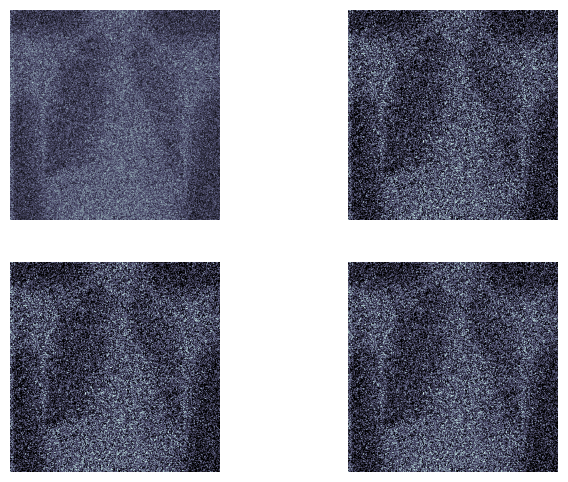

In [108]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 2, 1), plt.imshow(noisy_chest2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 2), plt.imshow(bilateral1, cmap='bone'), plt.axis('off')

plt.subplot(2, 2, 3), plt.imshow(bilateral2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 4), plt.imshow(bilateral3, cmap='bone'), plt.axis('off')

In [109]:
bilateral1 = bilateral1 / np.max(bilateral1)
bilateral2 = bilateral2 / np.max(bilateral2)
bilateral3 = bilateral3 / np.max(bilateral3)


In [110]:
print("Original-Noisy images PSNR", peak_signal_noise_ratio(chest, noisy_chest2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral1), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral3), "dB.")

print("Original-Noisy MSE", mean_squared_error(chest, noisy_chest2))
print("Original-Denoised1 MSE", mean_squared_error(chest, bilateral1))
print("Original-Denoised2 MSE", mean_squared_error(chest, bilateral2))
print("Original-Denoised3 MSE", mean_squared_error(chest, bilateral3))

Original-Noisy images PSNR 7.826424062561001 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Denoisy images PSNR 5.1022476453465435 dB.
Original-Noisy MSE 0.16495200308533434
Original-Denoised1 MSE 0.30886964964547414
Original-Denoised2 MSE 0.30886964964547414
Original-Denoised3 MSE 0.30886964964547414


As with brain image, chosen sigma values according to the litterature does not produce better PSNR.

### Low noise chest image

In [111]:
sigma_r = 1.95*0.05 # variance de 0.1 dans l'image
sigma_s = 80*sigma_r
bilateral1 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest1), 10, sigma_r, sigma_s)
bilateral2 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest1), 15, sigma_r, sigma_s)
bilateral3 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest1), 20, sigma_r, sigma_s)

(<AxesSubplot:>,
 (-0.5, 504.5, 504.5, -0.5))

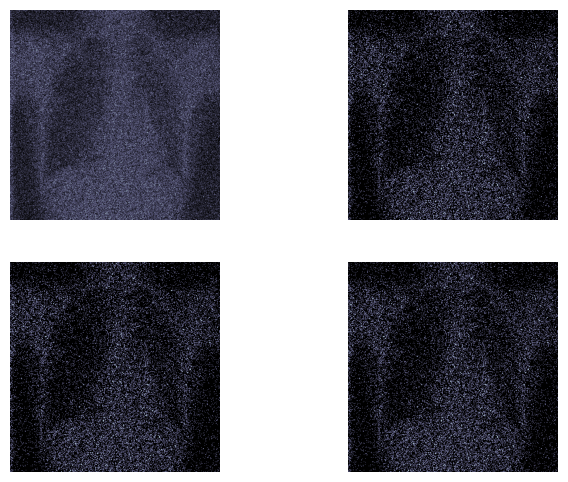

In [112]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 2, 1), plt.imshow(noisy_chest1, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 2), plt.imshow(bilateral1, cmap='bone'), plt.axis('off')

plt.subplot(2, 2, 3), plt.imshow(bilateral2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 4), plt.imshow(bilateral3, cmap='bone'), plt.axis('off')

In [113]:
bilateral1 = bilateral1 / np.max(bilateral1)
bilateral2 = bilateral2 / np.max(bilateral2)
bilateral3 = bilateral3 / np.max(bilateral3)


In [114]:
print("Original-Noisy images PSNR", peak_signal_noise_ratio(chest, noisy_chest1), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral1), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral3), "dB.")

print("Original-Noisy MSE", mean_squared_error(chest, noisy_chest1))
print("Original-Denoised1 MSE", mean_squared_error(chest, bilateral1))
print("Original-Denoised2 MSE", mean_squared_error(chest, bilateral2))
print("Original-Denoised3 MSE", mean_squared_error(chest, bilateral3))

Original-Noisy images PSNR 7.50940604032478 dB.
Original-Denoisy images PSNR 4.847310569910264 dB.
Original-Denoisy images PSNR 4.847310569910264 dB.
Original-Denoisy images PSNR 4.847310569910264 dB.
Original-Noisy MSE 0.17744321432116866
Original-Denoised1 MSE 0.3275434680189648
Original-Denoised2 MSE 0.3275434680189648
Original-Denoised3 MSE 0.3275434680189648


Even with low variance noise the result is the same. It sharpens a bit the image but delete information and we end up with lower PSNR value.

## BILATERAL FILTERING APPLIED ON IMAGE CORRUPTED WITH IMPULSIVE NOISE

In [115]:
sigma_r = 1.95*0.1 # variance de 0.2 dans l'image
sigma_s = 80*sigma_r
bilateral1 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest3), 10, sigma_r, sigma_s)
bilateral2 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest3), 15, sigma_r, sigma_s)
bilateral3 = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_chest3), 20, sigma_r, sigma_s)

(<AxesSubplot:>,
 (-0.5, 504.5, 504.5, -0.5))

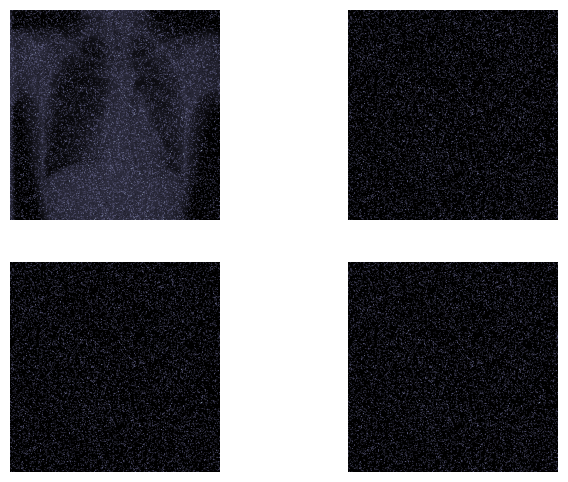

In [116]:
plt.figure(figsize=(8, 6))
plt.subplot(2, 2, 1), plt.imshow(noisy_chest3, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 2), plt.imshow(bilateral1, cmap='bone'), plt.axis('off')

plt.subplot(2, 2, 3), plt.imshow(bilateral2, cmap='bone'), plt.axis('off')
plt.subplot(2, 2, 4), plt.imshow(bilateral3, cmap='bone'), plt.axis('off')

In [117]:
bilateral1 = bilateral1 / np.max(bilateral1)
bilateral2 = bilateral2 / np.max(bilateral2)
bilateral3 = bilateral3 / np.max(bilateral3)

In [118]:
print("Original-Noisy images PSNR", peak_signal_noise_ratio(chest, noisy_chest3), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral1), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral2), "dB.")
print("Original-Denoisy images PSNR", peak_signal_noise_ratio(chest, bilateral3), "dB.")

print("Original-Noisy MSE", mean_squared_error(chest, noisy_chest3))
print("Original-Denoised1 MSE", mean_squared_error(chest, bilateral1))
print("Original-Denoised2 MSE", mean_squared_error(chest, bilateral2))
print("Original-Denoised3 MSE", mean_squared_error(chest, bilateral3))

Original-Noisy images PSNR 6.343686783067032 dB.
Original-Denoisy images PSNR 4.428138621354631 dB.
Original-Denoisy images PSNR 4.428138621354631 dB.
Original-Denoisy images PSNR 4.428138621354631 dB.
Original-Noisy MSE 0.23207658312004845
Original-Denoised1 MSE 0.36073321952825194
Original-Denoised2 MSE 0.36073321952825194
Original-Denoised3 MSE 0.36073321952825194


Bilateral filtering does not work on impulsive noise

No effect of changing to rgb image

# NLM(bilateral)

In [129]:
from skimage.restoration import denoise_nl_means, estimate_sigma

def nlm_bilateral(original_image, noisy_image): 
    '''NLM denoising applied after bilateral filtering. 
    Displays noisy and denoised images.
    Prints PSNR, MSE and SSIM values for each image.'''
    
    bilateral_image = cv2.bilateralFilter(cv2.convertScaleAbs(noisy_image), 1, 0.2, 0.2)

    sigma_est = np.mean(estimate_sigma(bilateral_image, channel_axis=-1))
    patch_kw = dict(patch_size=5,      # 5x5 patches
                    patch_distance=6,  # 13x13 search area
                    channel_axis=-1)
    nlm_bilateral_image = denoise_nl_means(bilateral_image, h= 1.15* sigma_est, sigma=sigma_est,
                                     fast_mode=True,multichannel=False, **patch_kw)

    plt.figure(figsize=(8, 6))
    plt.subplot(2, 2, 1), plt.imshow(original_image, cmap='bone'), plt.axis('off')
    plt.subplot(2, 2, 2), plt.imshow(noisy_image, cmap='bone'), plt.axis('off')
    plt.subplot(2, 2, 3), plt.imshow(bilateral_image, cmap='bone'), plt.axis('off')
    plt.subplot(2, 2, 4), plt.imshow(nlm_bilateral_image, cmap='bone'), plt.axis('off')
    
    bilateral_image = bilateral_image / np.max(bilateral_image)
    nlm_bilateral_image = nlm_bilateral_image / np.max(nlm_bilateral_image)
    
    print("Original-Noisy images PSNR", peak_signal_noise_ratio(original_image, noisy_image), "dB.")
    print("Original-Bilateral Denoisy images PSNR", peak_signal_noise_ratio(original_image, bilateral_image), "dB.")
    print("Original-NLM(bilateral) PSNR", peak_signal_noise_ratio(original_image, nlm_bilateral_image), "dB.")
    

    print("Original-Noisy MSE", mean_squared_error(original_image, noisy_image))
    print("Original-Bilateral Denoisy MSE", mean_squared_error(original_image, bilateral_image))
    print("Original-NLM(Bilateral) MSE", mean_squared_error(original_image, nlm_bilateral_image))
    
    print("Original-Noisy images SSIM", structural_similarity(original_image, noisy_image, data_range=1))
    print("Original-Bilateral Denoisy SSIM", structural_similarity(original_image, bilateral_image, data_range=1))
    print("Original-NLM(Bilateral) SSIM", structural_similarity(original_image, nlm_bilateral_image, data_range=1))


### Noisy brain 1

C:\Users\flore\AppData\Local\Temp\ipykernel_17536\2576547979.py:11: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  nlm_bilateral_image = denoise_nl_means(bilateral_image, h= 1.15* sigma_est, sigma=sigma_est,


Original-Noisy images PSNR 12.692480070524706 dB.
Original-Bilateral Denoisy images PSNR 7.839530760841802 dB.
Original-NLM(bilateral) PSNR 16.094433927888453 dB.
Original-Noisy MSE 0.05379624873549484
Original-Bilateral Denoisy MSE 0.16445494011089143
Original-NLM(Bilateral) MSE 0.024578569745937372
Original-Noisy images SSIM 0.12173955065902055
Original-Bilateral Denoisy SSIM 0.08022499071609948
Original-NLM(Bilateral) SSIM 0.425961654764203


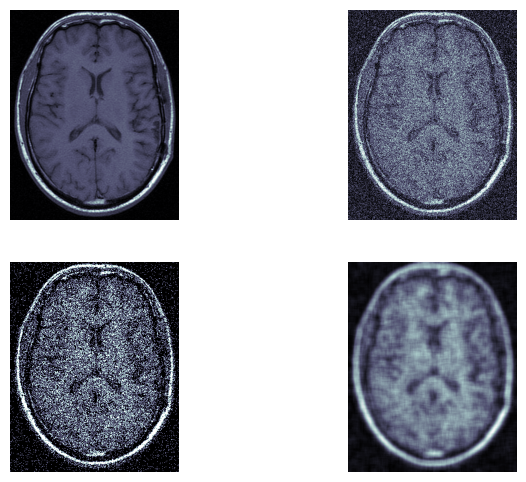

In [130]:
nlm_bilateral(brain, noisy_brain1)

### Noisy brain 2

C:\Users\flore\AppData\Local\Temp\ipykernel_17536\2576547979.py:11: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  nlm_bilateral_image = denoise_nl_means(bilateral_image, h= 1.15* sigma_est, sigma=sigma_est,


Original-Noisy images PSNR 9.271913491911555 dB.
Original-Bilateral Denoisy images PSNR 6.067221505840614 dB.
Original-NLM(bilateral) PSNR 11.071232291371313 dB.
Original-Noisy MSE 0.11825204250371342
Original-Bilateral Denoisy MSE 0.2473305990682366
Original-NLM(Bilateral) MSE 0.07814060526201781
Original-Noisy images SSIM 0.07446870441674419
Original-Bilateral Denoisy SSIM 0.04406640374403183
Original-NLM(Bilateral) SSIM 0.3267246192357753


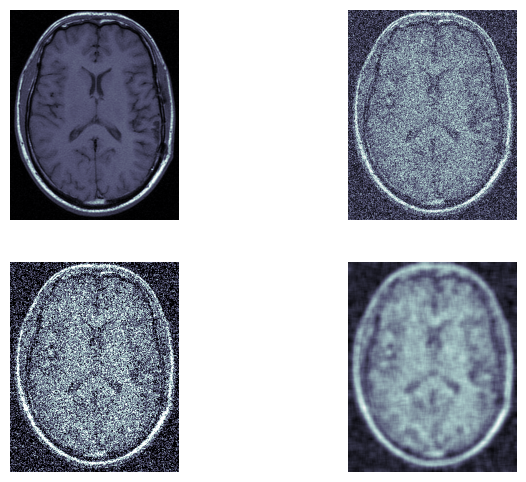

In [131]:
nlm_bilateral(brain, noisy_brain2)

### Noisy chest 1

C:\Users\flore\AppData\Local\Temp\ipykernel_17536\2576547979.py:11: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  nlm_bilateral_image = denoise_nl_means(bilateral_image, h= 1.15* sigma_est, sigma=sigma_est,


Original-Noisy images PSNR 7.50940604032478 dB.
Original-Bilateral Denoisy images PSNR 4.847310569910264 dB.
Original-NLM(bilateral) PSNR 12.757739469537384 dB.
Original-Noisy MSE 0.17744321432116866
Original-Bilateral Denoisy MSE 0.3275434680189648
Original-NLM(Bilateral) MSE 0.052993920885305246
Original-Noisy images SSIM 0.024283852681301434
Original-Bilateral Denoisy SSIM 0.01656427266843291
Original-NLM(Bilateral) SSIM 0.32043675809668315


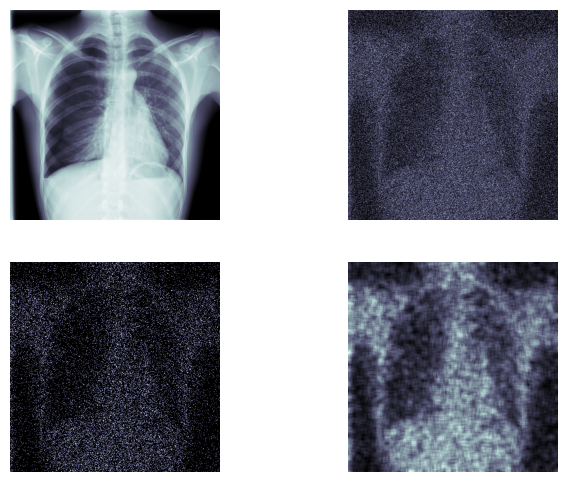

In [132]:
nlm_bilateral(chest, noisy_chest1)

### Noisy chest 2

C:\Users\flore\AppData\Local\Temp\ipykernel_17536\3246413052.py:11: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  nlm_bilateral_image = denoise_nl_means(bilateral_image, h= 1.15* sigma_est, sigma=sigma_est,


Original-Noisy images PSNR 7.826424062561001 dB.
Original-Bilateral Denoisy images PSNR 5.1022476453465435 dB.
Original-NLM(bilateral) PSNR 14.588151571329524 dB.
Original-Noisy MSE 0.16495200308533434
Original-Bilateral Denoisy MSE 0.30886964964547414
Original-NLM(Bilateral) MSE 0.03476841100260486
Original-Noisy images SSIM 0.014754776736102967
Original-Bilateral(NLM) SSIM 0.005793604469159398
Original-NLM(Bilateral) SSIM 0.35908384564063295


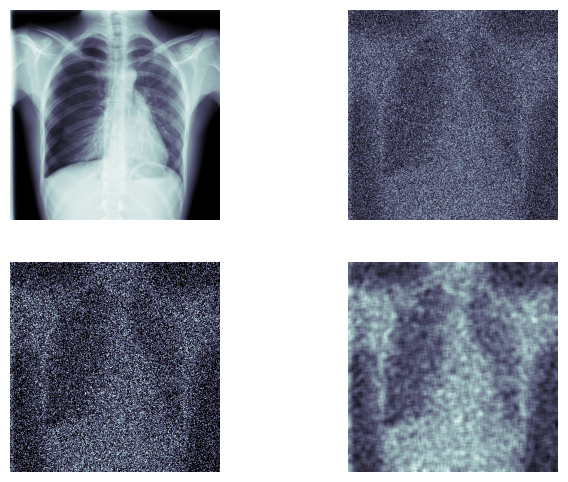

In [123]:
nlm_bilateral(chest, noisy_chest2)

# Bilateral(NLM)

In [138]:
def bilateral_nlm(original_image, noisy_image):
    '''Bilateral filtering applied after NLM denoising
    Displays noisy and denoised images.
    Prints PSNR, MSE and SSIM values for each image.'''

    sigma_est = np.mean(estimate_sigma(noisy_image, channel_axis=-1))
    patch_kw = dict(patch_size=5,      # 5x5 patches
                    patch_distance=6,  # 13x13 search area
                    channel_axis=-1)
    denoised_nlm = denoise_nl_means(noisy_image, h= 1.15* sigma_est, sigma=sigma_est,
                                     fast_mode=True,multichannel=False, **patch_kw)

    denoised_nlm_bilat = cv2.bilateralFilter(cv2.convertScaleAbs(denoised_nlm), 1, 0.3, 0.3)

    # normalize
    denoised_nlm_bilat = denoised_nlm_bilat / np.max(denoised_nlm_bilat)
    denoised_nlm = denoised_nlm / np.max(denoised_nlm)

    print("Original-Noisy PSNR", peak_signal_noise_ratio(original_image, noisy_image), "dB.")
    print("Original-Bilateral(NLM) Denoisy PSNR", peak_signal_noise_ratio(original_image, denoised_nlm_bilat), "dB.")
    print("Original-NLM Denoisy PSNR", peak_signal_noise_ratio(original_image, denoised_nlm), "dB.")

    print("Original-Noisy MSE", mean_squared_error(original_image, noisy_image))
    print("Original-Bilateral(NLM) Denoisy MSE", mean_squared_error(original_image, denoised_nlm_bilat))
    print("Original-NLM Denoisy MSE", mean_squared_error(original_image, denoised_nlm))
    
    print("Original-Noisy images SSIM", structural_similarity(original_image, noisy_image, data_range=1))
    print("Original-Bilateral(NLM) SSIM", structural_similarity(original_image, denoised_nlm_bilat, data_range=1))
    print("Original-NLM Denoisy images SSIM", structural_similarity(original_image, denoised_nlm, data_range=1))

    # plot images
    plt.figure(figsize=(8, 6))
    plt.subplot(2, 2, 1), plt.imshow(original_image, cmap='bone'), plt.axis('off')
    plt.subplot(2, 2, 2), plt.imshow(noisy_image, cmap='bone'), plt.axis('off')
    plt.subplot(2, 2, 3), plt.imshow(denoised_nlm, cmap='bone'), plt.axis('off')
    plt.subplot(2, 2, 4), plt.imshow(denoised_nlm_bilat, cmap='bone'), plt.axis('off')


### Noisy brain 1

C:\Users\flore\AppData\Local\Temp\ipykernel_17536\734627196.py:7: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  denoised_nlm = denoise_nl_means(noisy_image, h= 1.15* sigma_est, sigma=sigma_est,


Original-Noisy PSNR 12.692480070524706 dB.
Original-Bilateral(NLM) Denoisy PSNR 11.218310225613067 dB.
Original-NLM Denoisy PSNR 15.726447502516468 dB.
Original-Noisy MSE 0.05379624873549484
Original-Bilateral(NLM) Denoisy MSE 0.07553860798360451
Original-NLM Denoisy MSE 0.026751938031071787
Original-Noisy images SSIM 0.12173955065902055
Original-Bilateral(NLM) SSIM 0.1245346100224643
Original-NLM Denoisy images SSIM 0.4834012533492187


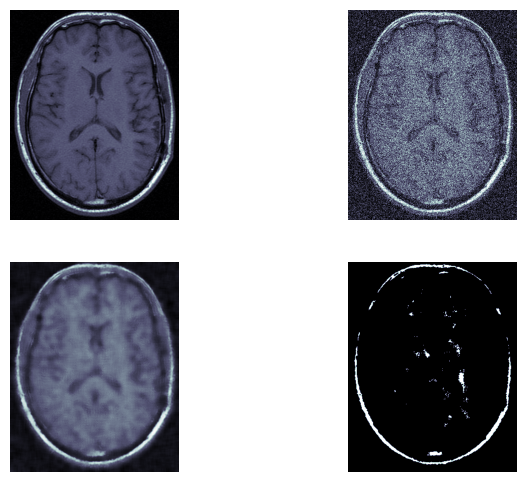

In [139]:
bilateral_nlm(brain, noisy_brain1)

### Noisy brain 2

C:\Users\flore\AppData\Local\Temp\ipykernel_17536\734627196.py:7: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  denoised_nlm = denoise_nl_means(noisy_image, h= 1.15* sigma_est, sigma=sigma_est,


Original-Noisy PSNR 9.271913491911555 dB.
Original-Bilateral(NLM) Denoisy PSNR 7.751165372866896 dB.
Original-NLM Denoisy PSNR 10.272967635520354 dB.
Original-Noisy MSE 0.11825204250371342
Original-Bilateral(NLM) Denoisy MSE 0.16783535932921992
Original-NLM Denoisy MSE 0.09390813950446908
Original-Noisy images SSIM 0.07446870441674419
Original-Bilateral(NLM) SSIM 0.2269195885795781
Original-NLM Denoisy images SSIM 0.36999980171462143


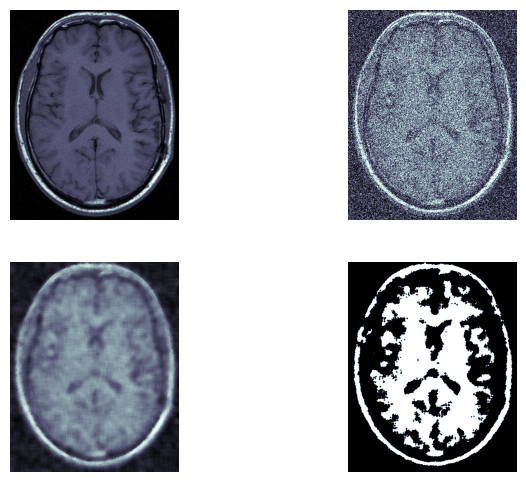

In [140]:
bilateral_nlm(brain, noisy_brain2)

### Noisy chest 1

C:\Users\flore\AppData\Local\Temp\ipykernel_17536\734627196.py:7: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  denoised_nlm = denoise_nl_means(noisy_image, h= 1.15* sigma_est, sigma=sigma_est,
C:\Users\flore\AppData\Local\Temp\ipykernel_17536\734627196.py:13: RuntimeWarning: invalid value encountered in true_divide
  denoised_nlm_bilat = denoised_nlm_bilat / np.max(denoised_nlm_bilat)


Original-Noisy PSNR 7.50940604032478 dB.
Original-Bilateral(NLM) Denoisy PSNR nan dB.
Original-NLM Denoisy PSNR 14.62760586944826 dB.
Original-Noisy MSE 0.17744321432116866
Original-Bilateral(NLM) Denoisy MSE nan
Original-NLM Denoisy MSE 0.03445398125150209
Original-Noisy images SSIM 0.024283852681301434
Original-Bilateral(NLM) SSIM nan
Original-NLM Denoisy images SSIM 0.43245075535266264


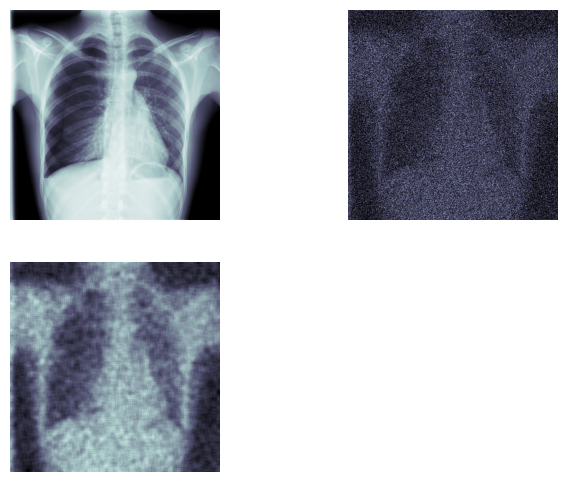

In [141]:
bilateral_nlm(chest, noisy_chest1)

### Noisy chest 2

C:\Users\flore\AppData\Local\Temp\ipykernel_17536\734627196.py:7: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  denoised_nlm = denoise_nl_means(noisy_image, h= 1.15* sigma_est, sigma=sigma_est,
C:\Users\flore\AppData\Local\Temp\ipykernel_17536\734627196.py:13: RuntimeWarning: invalid value encountered in true_divide
  denoised_nlm_bilat = denoised_nlm_bilat / np.max(denoised_nlm_bilat)


Original-Noisy PSNR 7.826424062561001 dB.
Original-Bilateral(NLM) Denoisy PSNR nan dB.
Original-NLM Denoisy PSNR 12.058615994779691 dB.
Original-Noisy MSE 0.16495200308533434
Original-Bilateral(NLM) Denoisy MSE nan
Original-NLM Denoisy MSE 0.06224986307912123
Original-Noisy images SSIM 0.014754776736102967
Original-Bilateral(NLM) SSIM nan
Original-NLM Denoisy images SSIM 0.40754302826571015


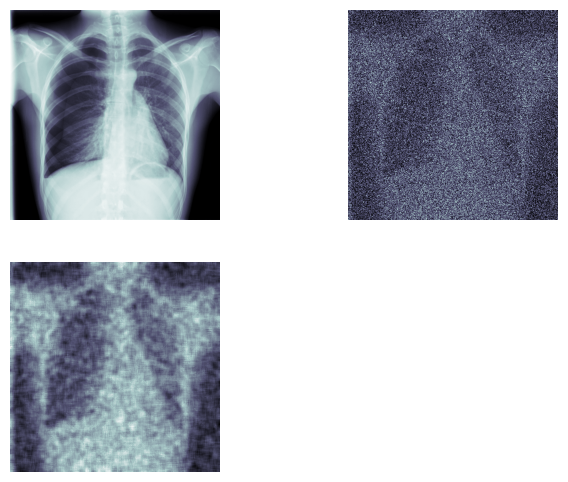

In [142]:
bilateral_nlm(chest, noisy_chest2)